# Auto-detect results viewer

Visualize each test result in `output-test/`: the input image (`downsample.jpg`) overlaid with the bounding boxes and selected points from `auto_detect.json`.

`auto_detect.json` fields (boxes are `[x1, y1, x2, y2]` in the downsample image's pixel space):
- `wall_bboxes` / `wall_selected_points`
- `floor_bboxes` / `floor_selected_points`
- `rug_bboxes`
- `door_bboxes` / `door_selected_points`
- `wall_masks` / `floor_masks` (base64 JPEGs, optional overlay)

In [1]:
import json
import base64
import io
from pathlib import Path

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

OUTPUT_DIR = Path("output-test")

# color per category
CATEGORIES = {
    "wall":  "#e6194B",
    "floor": "#3cb44b",
    "rug":   "#4363d8",
    "door":  "#f58231",
}

In [2]:
def load_sample(sample_dir: Path):
    """Load the downsample image and the auto_detect.json for one sample folder."""
    img = Image.open(sample_dir / "downsample.jpg").convert("RGB")
    with open(sample_dir / "auto_detect.json") as f:
        meta = json.load(f)
    return img, meta


def decode_mask(b64_str):
    """Decode a `data:image/jpeg;base64,...` mask string into a 2D numpy array."""
    raw = base64.b64decode(b64_str.split(",", 1)[1])
    return np.array(Image.open(io.BytesIO(raw)).convert("L"))


def _draw_overlay(ax, mask, color, alpha):
    m = np.asarray(mask, dtype=float)
    if m.max() > 1:
        m = m / 255.0
    overlay = np.zeros((*m.shape, 4), dtype=float)
    overlay[..., :3] = np.array(color) / 255.0
    overlay[..., 3] = m * alpha
    ax.imshow(overlay)


def show_sample(sample_dir: Path, show_masks=False, ax=None,
                overlay_mask=None, overlay_color=(255, 0, 255), overlay_alpha=0.45,
                overlays=None):
    """Show the image with bounding boxes/points and optional mask overlays.

    overlay_mask : a single mask drawn with `overlay_color`/`overlay_alpha`.
    overlays     : list of (mask, color) or (mask, color, alpha) tuples for
                   drawing several masks at once (e.g. wall + floor).
    """
    img, meta = load_sample(sample_dir)

    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(img)
    ax.set_title(sample_dir.name)
    ax.axis("off")

    # optional translucent mask overlays (stored wall/floor masks from the json)
    if show_masks:
        mask_colors = {"wall": (230, 25, 75), "floor": (60, 180, 75)}
        for cat, rgb in mask_colors.items():
            for b64 in meta.get(f"{cat}_masks", []):
                m = decode_mask(b64)
                _draw_overlay(ax, m > 127, rgb, 0.35)

    # single custom mask overlay
    if overlay_mask is not None:
        _draw_overlay(ax, overlay_mask, overlay_color, overlay_alpha)

    # multiple custom mask overlays
    for item in (overlays or []):
        mask, color = item[0], item[1]
        alpha = item[2] if len(item) > 2 else overlay_alpha
        _draw_overlay(ax, mask, color, alpha)

    # bounding boxes per category
    for cat, color in CATEGORIES.items():
        for (x1, y1, x2, y2) in meta.get(f"{cat}_bboxes", []):
            ax.add_patch(Rectangle(
                (x1, y1), x2 - x1, y2 - y1,
                edgecolor=color, facecolor="none", linewidth=2.5,
            ))
            ax.text(x1, y1 - 6, cat, color="white", fontsize=10, weight="bold",
                    bbox=dict(facecolor=color, edgecolor="none", pad=1.5))

        # selected points
        for (px, py) in meta.get(f"{cat}_selected_points", []):
            ax.plot(px, py, marker="*", color=color, markersize=16,
                    markeredgecolor="white", markeredgewidth=1.0)

    return ax

## Single sample

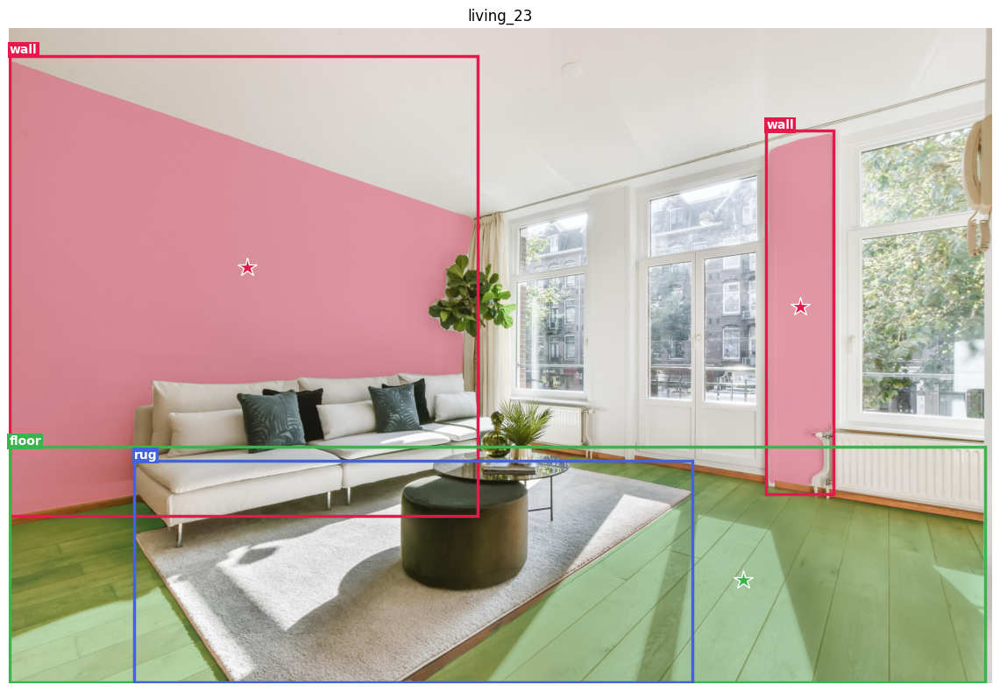

In [3]:
SAMPLE = "living_23"  # change to any folder name under output-test/

show_sample(OUTPUT_DIR / SAMPLE, show_masks=True)
plt.tight_layout()
plt.show()

## Gallery of several samples

224 samples found


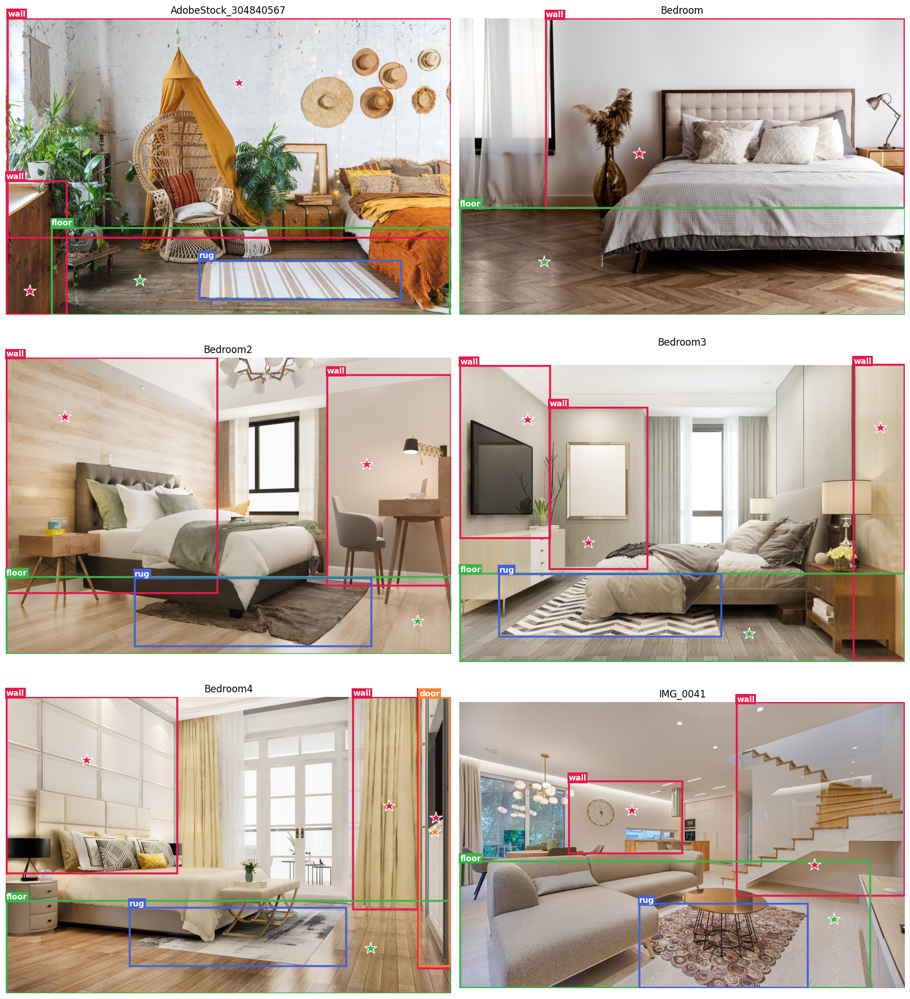

In [4]:
samples = sorted(p for p in OUTPUT_DIR.iterdir()
                 if (p / "downsample.jpg").exists() and (p / "auto_detect.json").exists())
print(f"{len(samples)} samples found")

N = min(6, len(samples))
cols = 2
rows = (N + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(16, 6 * rows))
for ax, sample_dir in zip(axes.ravel(), samples[:N]):
    show_sample(sample_dir, show_masks=False, ax=ax)
for ax in axes.ravel()[N:]:
    ax.axis("off")
plt.tight_layout()
plt.show()

## Re-create `wall` / `floor` / `rug` masks with BiRefNet

We **ignore** the stored `wall_masks` / `floor_masks` and rebuild them from the JSON
geometry + BiRefNet:

- the `*_bboxes` define **where** each surface lives;
- **BiRefNet** detects the foreground objects ("anything else") so they are **cut off**
  from the surfaces. The full-image pass is unioned with a **4×4 tiled** pass to catch
  small/peripheral objects (e.g. a plant by a bright window);
- **rug**: BiRefNet only segments the 3-D objects sitting *on* the rug, not the flat rug
  itself, so we refine the rug **bbox** into its true shape with **GrabCut**. The floor
  mask then subtracts this actual rug **footprint** (not the rectangle), so the
  triangular floor wedges around the rug stay floor and the rug is never floor;
- `*_selected_points` keep only the parts of each region connected to a confirmed sample.

Wall = red, floor = green, rug = blue.

In [5]:
# --- Load BiRefNet (from the local hq-mat/BiRefNet repo) ---
import sys
import cv2
import torch
import torch.nn.functional as F
from torchvision import transforms

BIREFNET_REPO = Path("hq-mat/BiRefNet").resolve()
if str(BIREFNET_REPO) not in sys.path:
    sys.path.insert(0, str(BIREFNET_REPO))

from models.birefnet import BiRefNet  # noqa: E402

device = "cuda" if torch.cuda.is_available() else "cpu"
torch.set_float32_matmul_precision("high")

model = BiRefNet.from_pretrained("zhengpeng7/birefnet")
model.to(device).eval()

transform_image = transforms.Compose([
    transforms.Resize((1024, 1024)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])
print(f"BiRefNet ready on {device}.")


@torch.no_grad()
def _birefnet_crop(image: Image.Image, box):
    """BiRefNet foreground for one crop, pasted back onto a full-image canvas."""
    w, h = image.size
    x1, y1, x2, y2 = (int(round(v)) for v in box)
    x1, y1, x2, y2 = max(0, x1), max(0, y1), min(w, x2), min(h, y2)
    canvas = np.zeros((h, w), dtype=np.float32)
    if x2 <= x1 or y2 <= y1:
        return canvas
    pred = model(transform_image(image.crop((x1, y1, x2, y2))).unsqueeze(0).to(device))
    pred = pred[-1].sigmoid().cpu()[0, 0]
    canvas[y1:y2, x1:x2] = F.interpolate(pred[None, None], size=(y2 - y1, x2 - x1),
                                         mode="bilinear", align_corners=True)[0, 0].numpy()
    return canvas


def birefnet_objects(image: Image.Image, tiles=4, overlap=0.25):
    """Foreground-object mask = union of a full-image pass and an NxN tiled pass.

    The tiled pass restores recall for small / peripheral objects (e.g. a plant by
    a bright window) that the single 1024px full-image pass downscales away.
    """
    w, h = image.size
    out = _birefnet_crop(image, (0, 0, w, h))
    if tiles and tiles > 1:
        tw, th = w / tiles, h / tiles
        for j in range(tiles):
            for i in range(tiles):
                box = (i * tw - overlap * tw, j * th - overlap * th,
                       (i + 1) * tw + overlap * tw, (j + 1) * th + overlap * th)
                out = np.maximum(out, _birefnet_crop(image, box))
    return out


def grabcut_region(image: Image.Image, bbox, scale=0.4, iters=5):
    """Refine a bbox into the actual flat-surface footprint (e.g. the rug).

    BiRefNet only segments salient 3-D objects, so it returns the things *on* the
    rug, not the rug outline. GrabCut seeded with the rug bbox separates the rug
    from the surrounding floor, giving its true (non-rectangular) shape.
    """
    arr = cv2.cvtColor(np.array(image.convert("RGB")), cv2.COLOR_RGB2BGR)
    h, w = arr.shape[:2]
    x1, y1, x2, y2 = (int(round(v)) for v in bbox)
    x1, y1, x2, y2 = max(0, x1), max(0, y1), min(w, x2), min(h, y2)
    out = np.zeros((h, w), dtype=bool)
    if x2 - x1 < 4 or y2 - y1 < 4:
        out[y1:y2, x1:x2] = True
        return out
    small = cv2.resize(arr, (max(1, int(w * scale)), max(1, int(h * scale))))
    rect = (int(x1 * scale), int(y1 * scale),
            max(1, int((x2 - x1) * scale)), max(1, int((y2 - y1) * scale)))
    m = np.zeros(small.shape[:2], np.uint8)
    try:
        cv2.grabCut(small, m, rect, np.zeros((1, 65), np.float64),
                    np.zeros((1, 65), np.float64), iters, cv2.GC_INIT_WITH_RECT)
    except cv2.error:
        out[y1:y2, x1:x2] = True
        return out
    fg = ((m == cv2.GC_FGD) | (m == cv2.GC_PR_FGD)).astype(np.uint8)
    return cv2.resize(fg, (w, h), interpolation=cv2.INTER_NEAREST).astype(bool)


def _bbox_region(bboxes, h, w):
    """Binary mask = union of the given [x1,y1,x2,y2] boxes."""
    r = np.zeros((h, w), dtype=bool)
    for x1, y1, x2, y2 in bboxes:
        x1, y1, x2, y2 = (int(round(v)) for v in (x1, y1, x2, y2))
        r[max(0, y1):min(h, y2), max(0, x1):min(w, x2)] = True
    return r


def _keep_blobs_with_points(mask, points, w, h):
    """Keep only connected components of `mask` that contain a selected point."""
    if not points:
        return mask
    n, labels = cv2.connectedComponents(mask.astype(np.uint8))
    keep = set()
    for px, py in points:
        px = int(min(max(px, 0), w - 1))
        py = int(min(max(py, 0), h - 1))
        if labels[py, px] > 0:
            keep.add(int(labels[py, px]))
    return np.isin(labels, list(keep)) if keep else mask


def build_surface_masks(sample_dir: Path, thresh=0.5, tiles=4):
    """Rebuild wall / floor / rug masks.

    - objects: BiRefNet foreground (full image + tiled) -> "anything else" to cut off.
    - rug: GrabCut on each rug bbox -> the actual rug footprint, minus the objects on it.
    - wall: wall bbox minus door region and objects (wall WINS the wall/floor overlap).
    - floor: floor bbox minus the wall region, the rug footprint, door and objects, so
      the wall is not overridden by the floor and the rug wedges stay floor.
    """
    img, meta = load_sample(sample_dir)
    w, h = img.size

    objects = birefnet_objects(img, tiles=tiles) >= thresh
    wall_r = _bbox_region(meta.get("wall_bboxes", []), h, w)
    floor_r = _bbox_region(meta.get("floor_bboxes", []), h, w)
    door_r = _bbox_region(meta.get("door_bboxes", []), h, w)

    # actual rug footprint via GrabCut (not the rectangular bbox)
    rug_fp = np.zeros((h, w), dtype=bool)
    for b in meta.get("rug_bboxes", []):
        rug_fp |= grabcut_region(img, b)

    rug = rug_fp & ~objects                                  # rug surface, objects removed
    # wall wins where wall and floor boxes overlap
    wall = wall_r & ~door_r & ~objects
    wall = _keep_blobs_with_points(wall, meta.get("wall_selected_points"), w, h)
    # floor yields the overlap to the wall, and excludes the rug footprint
    floor = floor_r & ~wall_r & ~rug_fp & ~door_r & ~objects
    floor = _keep_blobs_with_points(floor, meta.get("floor_selected_points"), w, h)

    return img, meta, {"wall": wall, "floor": floor, "rug": rug}, objects


def mask_to_pil(mask) -> Image.Image:
    """Boolean/float mask -> 8-bit single-channel PIL image (255 = surface)."""
    return Image.fromarray((np.asarray(mask) > 0).astype(np.uint8) * 255, mode="L")

/home/krist/miniconda3/envs/birefnet/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


BiRefNet ready on cuda.


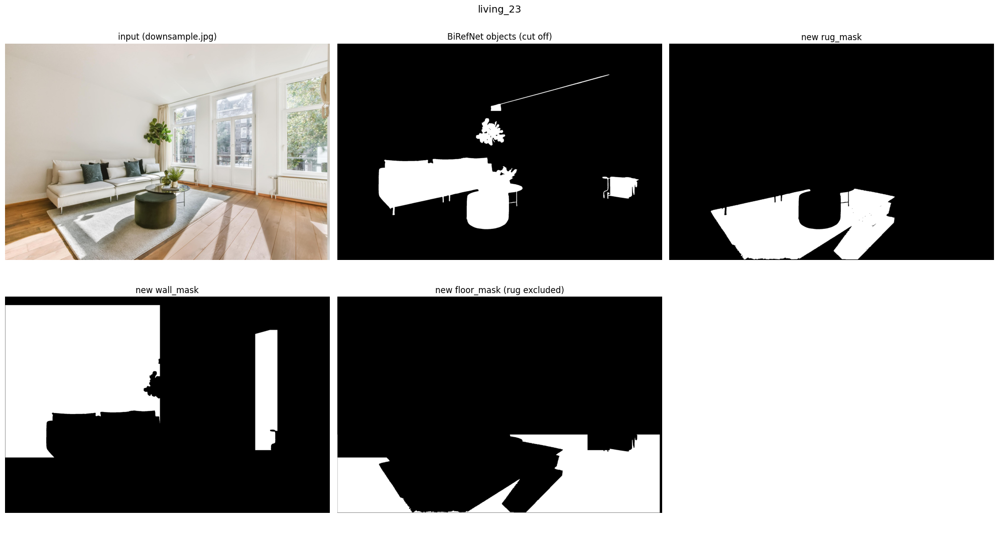

saved wall_/floor_/rug_mask_birefnet.png in output-test/living_23


In [6]:
SAMPLE = "living_23"   # any folder under output-test/
THRESH = 0.5           # BiRefNet threshold for "is this a foreground object?"

img, meta, masks, objects = build_surface_masks(OUTPUT_DIR / SAMPLE, thresh=THRESH)
wall_mask, floor_mask, rug_mask = masks["wall"], masks["floor"], masks["rug"]

fig, axes = plt.subplots(2, 3, figsize=(20, 11))
axes[0, 0].imshow(img);                       axes[0, 0].set_title("input (downsample.jpg)")
axes[0, 1].imshow(objects >= THRESH, cmap="gray"); axes[0, 1].set_title("BiRefNet objects (cut off)")
axes[0, 2].imshow(rug_mask, cmap="gray");     axes[0, 2].set_title("new rug_mask")
axes[1, 0].imshow(wall_mask, cmap="gray");    axes[1, 0].set_title("new wall_mask")
axes[1, 1].imshow(floor_mask, cmap="gray");   axes[1, 1].set_title("new floor_mask (rug excluded)")
axes[1, 2].axis("off")
for ax in axes.ravel()[:5]:
    ax.axis("off")
fig.suptitle(SAMPLE, fontsize=14)
plt.tight_layout()
plt.show()

# Save the regenerated masks next to the source files
mask_to_pil(wall_mask).save(OUTPUT_DIR / SAMPLE / "wall_mask_birefnet.png")
mask_to_pil(floor_mask).save(OUTPUT_DIR / SAMPLE / "floor_mask_birefnet.png")
mask_to_pil(rug_mask).save(OUTPUT_DIR / SAMPLE / "rug_mask_birefnet.png")
print("saved wall_/floor_/rug_mask_birefnet.png in", OUTPUT_DIR / SAMPLE)

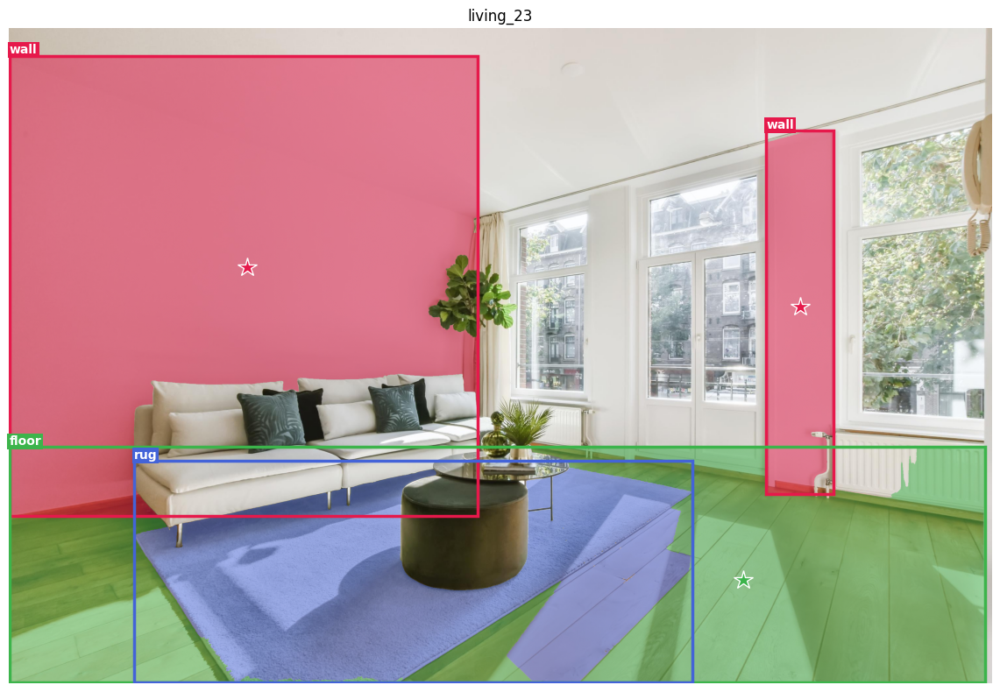

In [7]:
# Final output: overlay the regenerated wall (red), floor (green), rug (blue) masks
show_sample(
    OUTPUT_DIR / SAMPLE,
    overlays=[
        (wall_mask,  (230, 25, 75)),    # wall
        (floor_mask, (60, 180, 75)),    # floor (rug excluded)
        (rug_mask,   (67, 99, 216)),    # rug
    ],
    overlay_alpha=0.5,
)
plt.tight_layout()
plt.show()

# Full pipeline: GroundingDINO + SAM + BiRefNet

Implements `docs/pipeline-design.md`.

**Objects to remove** = SAM-cut **GroundingDINO** occluders (flat wall items:
window/mirror/door/painting/picture/tv/poster/clock/curtain) ∪ **BiRefNet** class-agnostic
3-D foreground (full + tiled).

**Surfaces** = **SAM** point-prompted with the JSON `*_selected_points`, intersected with
the category bbox so they can't bleed.

**Final**: `wall = SAM_wall − objects`, `floor = SAM_floor − rug − objects`,
`rug = GrabCut(rug_bbox) − objects` (kept deliverable). All objects are removed from both
surfaces (anchoring is QA-only). Outputs `wall_mask.png` / `floor_mask.png` / `rug_mask.png`.

In [8]:
# --- Load GroundingDINO + SAM (HuggingFace transformers) ---
from transformers import (AutoProcessor, AutoModelForZeroShotObjectDetection,
                          SamModel, SamProcessor)

DINO_ID = "IDEA-Research/grounding-dino-base"
SAM_ID = "facebook/sam-vit-huge"
OCCLUDER_PROMPT = "window. mirror. door. painting. picture. tv. poster. clock. curtain."

dino_proc = AutoProcessor.from_pretrained(DINO_ID)
dino = AutoModelForZeroShotObjectDetection.from_pretrained(DINO_ID).to(device).eval()
sam_proc = SamProcessor.from_pretrained(SAM_ID)
sam = SamModel.from_pretrained(SAM_ID).to(device).eval()
print("GroundingDINO + SAM ready.")


@torch.no_grad()
def detect_occluders(image, prompt=OCCLUDER_PROMPT, box_thresh=0.3, text_thresh=0.25):
    """GroundingDINO -> (boxes [x1,y1,x2,y2], labels) for the flat wall occluders."""
    inp = dino_proc(images=image, text=prompt, return_tensors="pt").to(device)
    out = dino(**inp)
    res = dino_proc.post_process_grounded_object_detection(
        out, inp["input_ids"], threshold=box_thresh, text_threshold=text_thresh,
        target_sizes=[image.size[::-1]])[0]
    boxes = [[float(v) for v in b] for b in res["boxes"].tolist()]
    labels = list(res.get("text_labels", res.get("labels", [])))
    return boxes, labels


@torch.no_grad()
def _sam_best(image, **prompt):
    """Run SAM and return (masks [N,3,H,W] bool-ish, iou_scores [N,3])."""
    inp = sam_proc(image, return_tensors="pt", **prompt).to(device)
    out = sam(**inp)
    masks = sam_proc.image_processor.post_process_masks(
        out.pred_masks.cpu(), inp["original_sizes"].cpu(),
        inp["reshaped_input_sizes"].cpu())[0]
    return masks, out.iou_scores.cpu()[0]


def sam_boxes_union(image, boxes):
    """Union of best-IoU SAM mask per box (precise occluder masks)."""
    w, h = image.size
    u = np.zeros((h, w), dtype=bool)
    if not boxes:
        return u
    masks, scores = _sam_best(image, input_boxes=[boxes])
    for i in range(masks.shape[0]):
        u |= (masks[i, int(scores[i].argmax())] > 0).numpy()
    return u


def sam_points_union(image, points, region=None):
    """Union of best-IoU SAM mask per point, optionally clipped to `region`."""
    w, h = image.size
    u = np.zeros((h, w), dtype=bool)
    for p in (points or []):
        masks, scores = _sam_best(image, input_points=[[[float(p[0]), float(p[1])]]],
                                  input_labels=[[1]])
        u |= (masks[0, int(scores[0].argmax())] > 0).numpy()
    if region is not None:
        u &= region
    return u


def detect_surfaces(image, wall_points, floor_points, wall_bboxes, floor_bboxes):
    """Wall/floor surface masks = SAM point-prompt ∩ bbox region.

    Single function used for BOTH the original image and the Imagen empty room (caller
    scales points/bboxes to the image being passed in)."""
    w, h = image.size
    wall = sam_points_union(image, wall_points, region=_bbox_region(wall_bboxes, h, w))
    floor = sam_points_union(image, floor_points, region=_bbox_region(floor_bboxes, h, w))
    return wall, floor


def build_masks_full(sample_dir: Path, thresh=0.5, tiles=4):
    """Full DINO + SAM + BiRefNet pipeline (docs/pipeline-design.md)."""
    img, meta = load_sample(sample_dir)
    w, h = img.size

    # Stage 1 - objects to remove
    boxes, labels = detect_occluders(img)
    occluders = sam_boxes_union(img, boxes)                       # SAM-cut DINO occluders
    objects_3d = birefnet_objects(img, tiles=tiles) >= thresh     # BiRefNet catch-all
    objects_all = occluders | objects_3d

    # Stage 2 - surfaces (SAM points ∩ bbox)
    wall_s, floor_s = detect_surfaces(
        img, meta.get("wall_selected_points"), meta.get("floor_selected_points"),
        meta.get("wall_bboxes", []), meta.get("floor_bboxes", []))

    # Stage 3 - rug footprint (GrabCut), kept deliverable
    rug_fp = np.zeros((h, w), dtype=bool)
    for b in meta.get("rug_bboxes", []):
        rug_fp |= grabcut_region(img, b)

    # Stage 4 - final masks. Wall keeps the objects in front of it (whole wall
    # within its bbox, incl. occluders like plants); floor/rug still cut.
    wall_region = _bbox_region(meta.get("wall_bboxes", []), h, w)
    rug = rug_fp & ~objects_all
    wall = wall_s | (objects_all & wall_region)
    floor = floor_s & ~rug_fp & ~objects_all

    dbg = {"objects": objects_all, "occluders": occluders, "boxes": boxes, "labels": labels}
    return img, meta, {"wall": wall, "floor": floor, "rug": rug}, dbg

Loading weights: 100%|██████████| 594/594 [00:01<00:00, 494.22it/s] 


GroundingDINO + SAM ready.


/home/krist/miniconda3/envs/birefnet/lib/python3.10/site-packages/transformers/models/grounding_dino/processing_grounding_dino.py:96: FutureWarning: The key `labels` is will return integer ids in `GroundingDinoProcessor.post_process_grounded_object_detection` output since v4.51.0. Use `text_labels` instead to retrieve string object names.
  warnings.warn(self.message, FutureWarning)


DINO occluders: [('curtain', [1383, 551, 1530, 1196]), ('window', [2546, 260, 2984, 1256]), ('window', [1520, 531, 1780, 1159]), ('door', [1913, 653, 2317, 1363])]


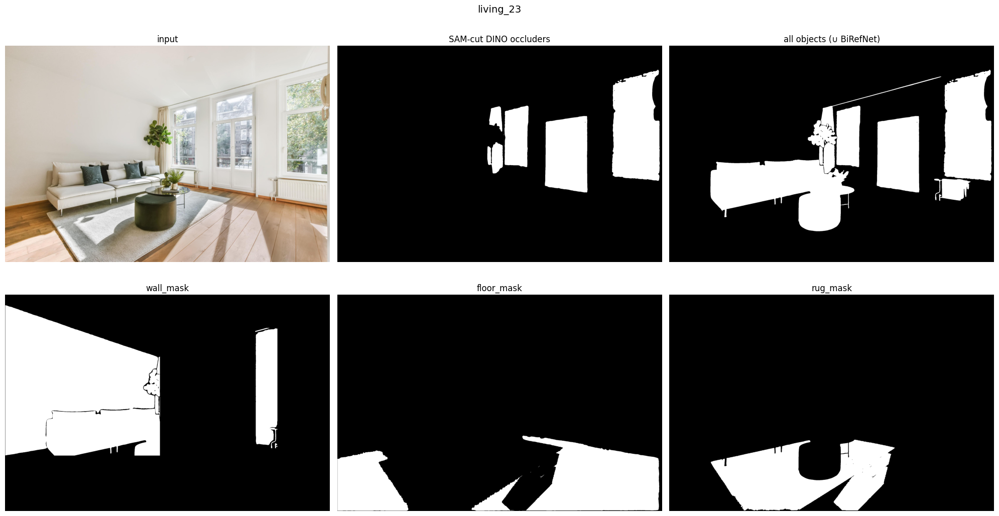

saved wall_mask.png / floor_mask.png / rug_mask.png in output-test/living_23


In [9]:
SAMPLE = "living_23"   # any folder under output-test/

img, meta, masks, dbg = build_masks_full(OUTPUT_DIR / SAMPLE)
wall_mask, floor_mask, rug_mask = masks["wall"], masks["floor"], masks["rug"]
print("DINO occluders:", list(zip(dbg["labels"], [[round(v) for v in b] for b in dbg["boxes"]])))

fig, axes = plt.subplots(2, 3, figsize=(20, 11))
axes[0, 0].imshow(img);                          axes[0, 0].set_title("input")
axes[0, 1].imshow(dbg["occluders"], cmap="gray"); axes[0, 1].set_title("SAM-cut DINO occluders")
axes[0, 2].imshow(dbg["objects"], cmap="gray");   axes[0, 2].set_title("all objects (∪ BiRefNet)")
axes[1, 0].imshow(wall_mask, cmap="gray");        axes[1, 0].set_title("wall_mask")
axes[1, 1].imshow(floor_mask, cmap="gray");       axes[1, 1].set_title("floor_mask")
axes[1, 2].imshow(rug_mask, cmap="gray");         axes[1, 2].set_title("rug_mask")
for ax in axes.ravel():
    ax.axis("off")
fig.suptitle(SAMPLE, fontsize=14)
plt.tight_layout()
plt.show()

mask_to_pil(wall_mask).save(OUTPUT_DIR / SAMPLE / "wall_mask.png")
mask_to_pil(floor_mask).save(OUTPUT_DIR / SAMPLE / "floor_mask.png")
mask_to_pil(rug_mask).save(OUTPUT_DIR / SAMPLE / "rug_mask.png")
print("saved wall_mask.png / floor_mask.png / rug_mask.png in", OUTPUT_DIR / SAMPLE)

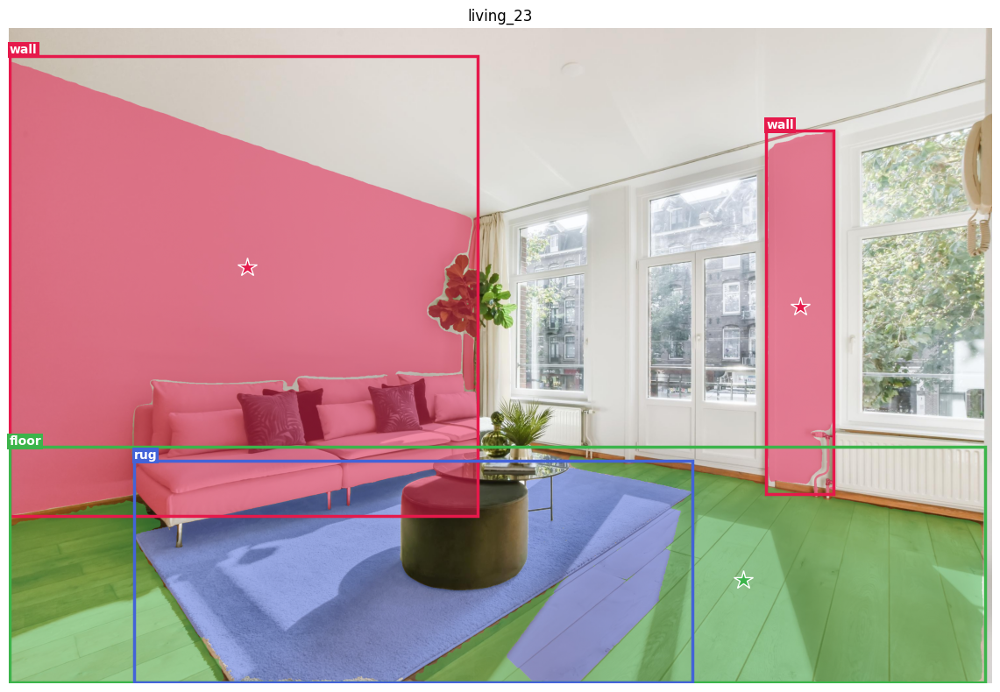

In [10]:
# Overlay the final masks via show_sample(): wall=red, floor=green, rug=blue
show_sample(
    OUTPUT_DIR / SAMPLE,
    overlays=[
        (wall_mask,  (230, 25, 75)),
        (floor_mask, (60, 180, 75)),
        (rug_mask,   (67, 99, 216)),
    ],
    overlay_alpha=0.5,
)
plt.tight_layout()
plt.show()

# Amodal pipeline: Imagen empty-room + SAM + homography

Recovers the **full** wall/floor (incl. parts hidden behind furniture) from a Imagen-generated
empty room, registered back to the original.

Flow:
1. **Original → BiRefNet** → object mask, **saved** (`object_mask_birefnet.png`).
2. **Imagen empty room → SAM** (JSON points scaled to the empty image) → full wall / floor in
   *empty-image space*.
3. **Homography register** empty → original (SIFT + RANSAC) → warp the full masks onto the
   original pixels (fixes the geometry drift from online generation).
4. **Subtract** the BiRefNet object mask → **visible** wall/floor; keep the un-subtracted
   warp as the **amodal** wall/floor.

Needs a per-sample empty-room image (`empty_imagen.png`), generated by the Imagen cell above.

In [11]:
def register_homography(src_img, dst_img, nfeat=4000, ratio=0.75, reproj=5.0):
    """SIFT + RANSAC homography mapping src_img pixels -> dst_img pixels."""
    sg = cv2.cvtColor(np.array(src_img.convert("RGB")), cv2.COLOR_RGB2GRAY)
    dg = cv2.cvtColor(np.array(dst_img.convert("RGB")), cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create(nfeat)
    k1, d1 = sift.detectAndCompute(sg, None)
    k2, d2 = sift.detectAndCompute(dg, None)
    good = [m for m, n in cv2.BFMatcher().knnMatch(d1, d2, k=2) if m.distance < ratio * n.distance]
    src = np.float32([k1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst = np.float32([k2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
    H, inl = cv2.findHomography(src, dst, cv2.RANSAC, reproj)
    return H, int(inl.sum()) if inl is not None else 0, len(good)


def warp_mask(mask, H, size):
    """Warp a boolean mask through homography H to (w, h) size."""
    return cv2.warpPerspective(mask.astype(np.uint8) * 255, H, size,
                               flags=cv2.INTER_NEAREST) > 127


def build_masks_amodal(sample_dir: Path, empty_path, thresh=0.5, tiles=4):
    """Imagen empty-room + SAM + homography -> amodal & visible wall/floor.

    The empty room uses the SAME detect_surfaces() as the original; points/bboxes are
    just scaled to the empty image's size. Returns masks {wall, floor} = VISIBLE (objects
    subtracted); dbg carries the object mask, the amodal warps, and register stats.
    """
    img, meta = load_sample(sample_dir)
    w, h = img.size

    # 1. original -> BiRefNet objects
    objects = birefnet_objects(img, tiles=tiles) >= thresh

    # 2. Imagen empty -> same surface detector, points/bboxes scaled to empty size
    qimg = Image.open(empty_path).convert("RGB")
    qw, qh = qimg.size
    sx, sy = qw / w, qh / h
    scl_pts = lambda pts: [[p[0] * sx, p[1] * sy] for p in (pts or [])]
    scl_box = lambda bs: [[b[0] * sx, b[1] * sy, b[2] * sx, b[3] * sy] for b in (bs or [])]
    q_wall, q_floor = detect_surfaces(
        qimg, scl_pts(meta.get("wall_selected_points")), scl_pts(meta.get("floor_selected_points")),
        scl_box(meta.get("wall_bboxes", [])), scl_box(meta.get("floor_bboxes", [])))

    # 3. register empty -> original, warp the full masks back
    H, inliers, matches = register_homography(qimg, img)
    full_wall = warp_mask(q_wall, H, (w, h))
    full_floor = warp_mask(q_floor, H, (w, h))

    # 4. subtract objects -> visible surfaces
    wall = full_wall & ~objects
    floor = full_floor & ~objects

    dbg = {"objects": objects, "full_wall": full_wall, "full_floor": full_floor,
           "inliers": inliers, "matches": matches, "empty": qimg}
    return img, meta, {"wall": wall, "floor": floor}, dbg

In [ ]:
# --- Imagen 3 inpainting empty-room (Vertex via google-genai) ---
# Real image + BiRefNet object mask -> Imagen removes masked objects, fills background.
# NOTE: Imagen 4 has no editing model; inpainting runs on imagen-3.0-capability-001.
# Auth = gcloud ADC: run `gcloud auth application-default login` and
#        `gcloud auth application-default set-quota-project <PROJECT_ID>` once;
#        enable the Vertex AI API on the project. No API key used here.
import os
from google import genai
from google.genai import types
from dotenv import load_dotenv

load_dotenv(override=True)                       # GOOGLE_CLOUD_PROJECT / _LOCATION from .env
# Drop a stale service-account path so we fall back to gcloud ADC (the kernel may
# still hold an old GOOGLE_APPLICATION_CREDENTIALS that points to a missing file).
_gac = os.environ.get("GOOGLE_APPLICATION_CREDENTIALS")
if _gac and not os.path.exists(_gac):
    os.environ.pop("GOOGLE_APPLICATION_CREDENTIALS")
PROJECT_ID = os.environ.get("GOOGLE_CLOUD_PROJECT") or os.environ.get("GCP_PROJECT")
LOCATION   = os.environ.get("GOOGLE_CLOUD_LOCATION", "us-central1")
assert PROJECT_ID, "Put GOOGLE_CLOUD_PROJECT=<project id> in .env (Vertex uses ADC, not an API key)"
genai_client = genai.Client(vertexai=True, project=PROJECT_ID, location=LOCATION)

IMAGEN_EDIT_MODEL = "imagen-3.0-capability-001"
# Removal works best with an EMPTY prompt. A descriptive prompt makes Imagen
# *generate* new furniture to fill the hole instead of clearing it.
EMPTY_INPAINT_PROMPT = ""


def imagen_empty_room(sample_dir, out_path, thresh=0.5, tiles=4, prompt=EMPTY_INPAINT_PROMPT):
    """BiRefNet object mask -> Imagen inpaint-removal -> empty-room PNG (returns out_path)."""
    img, _ = load_sample(sample_dir)
    objects = birefnet_objects(img, tiles=tiles) >= thresh        # white = object to remove
    base_path = str(sample_dir / "downsample.jpg")
    mask_path = str(sample_dir / "object_mask_birefnet.png")
    mask_to_pil(objects).save(mask_path)

    raw_ref = types.RawReferenceImage(
        reference_image=types.Image.from_file(location=base_path), reference_id=0)
    mask_ref = types.MaskReferenceImage(
        reference_id=1, reference_image=types.Image.from_file(location=mask_path),
        config=types.MaskReferenceConfig(mask_mode="MASK_MODE_USER_PROVIDED", mask_dilation=0.03))
    resp = genai_client.models.edit_image(
        model=IMAGEN_EDIT_MODEL, prompt=prompt,
        reference_images=[raw_ref, mask_ref],
        config=types.EditImageConfig(edit_mode="EDIT_MODE_INPAINT_REMOVAL", number_of_images=1))
    resp.generated_images[0].image.save(str(out_path))
    return out_path


Gemini empty room saved -> output-test/Bedroom/empty_gemini.png
homography register: 17/40 inliers
saved object_mask_birefnet / wall|floor _visible / _amodal in output-test/Bedroom


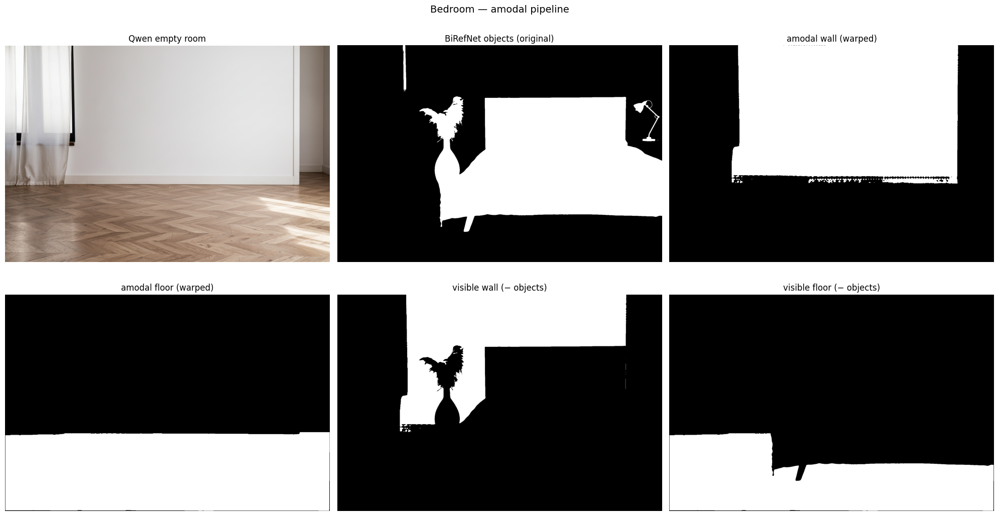

In [ ]:
SAMPLE = "Bedroom"        # any folder under output-test/

# Imagen 4 inpainting: remove BiRefNet objects + fill background -> empty room (cached)
EMPTY_PATH = OUTPUT_DIR / SAMPLE / "empty_imagen.png"
imagen_empty_room(OUTPUT_DIR / SAMPLE, EMPTY_PATH)   # always regenerate
print("Imagen empty room saved ->", EMPTY_PATH)

img, meta, masks, dbg = build_masks_amodal(OUTPUT_DIR / SAMPLE, EMPTY_PATH)
wall_v, floor_v = masks["wall"], masks["floor"]
print(f"homography register: {dbg['inliers']}/{dbg['matches']} inliers")

# save: BiRefNet object mask (step 1) + visible + amodal surfaces
mask_to_pil(dbg["objects"]).save(OUTPUT_DIR / SAMPLE / "object_mask_birefnet.png")
mask_to_pil(wall_v).save(OUTPUT_DIR / SAMPLE / "wall_mask_visible.png")
mask_to_pil(floor_v).save(OUTPUT_DIR / SAMPLE / "floor_mask_visible.png")
mask_to_pil(dbg["full_wall"]).save(OUTPUT_DIR / SAMPLE / "wall_mask_amodal.png")
mask_to_pil(dbg["full_floor"]).save(OUTPUT_DIR / SAMPLE / "floor_mask_amodal.png")
print("saved object_mask_birefnet / wall|floor _visible / _amodal in", OUTPUT_DIR / SAMPLE)

fig, axes = plt.subplots(2, 3, figsize=(20, 11))
axes[0, 0].imshow(dbg["empty"]);                axes[0, 0].set_title("Imagen empty room")
axes[0, 1].imshow(dbg["objects"], cmap="gray"); axes[0, 1].set_title("BiRefNet objects (original)")
axes[0, 2].imshow(dbg["full_wall"], cmap="gray"); axes[0, 2].set_title("amodal wall (warped)")
axes[1, 0].imshow(dbg["full_floor"], cmap="gray"); axes[1, 0].set_title("amodal floor (warped)")
axes[1, 1].imshow(wall_v, cmap="gray");         axes[1, 1].set_title("visible wall (− objects)")
axes[1, 2].imshow(floor_v, cmap="gray");        axes[1, 2].set_title("visible floor (− objects)")
for ax in axes.ravel():
    ax.axis("off")
fig.suptitle(f"{SAMPLE} — amodal pipeline", fontsize=14)
plt.tight_layout()
plt.show()

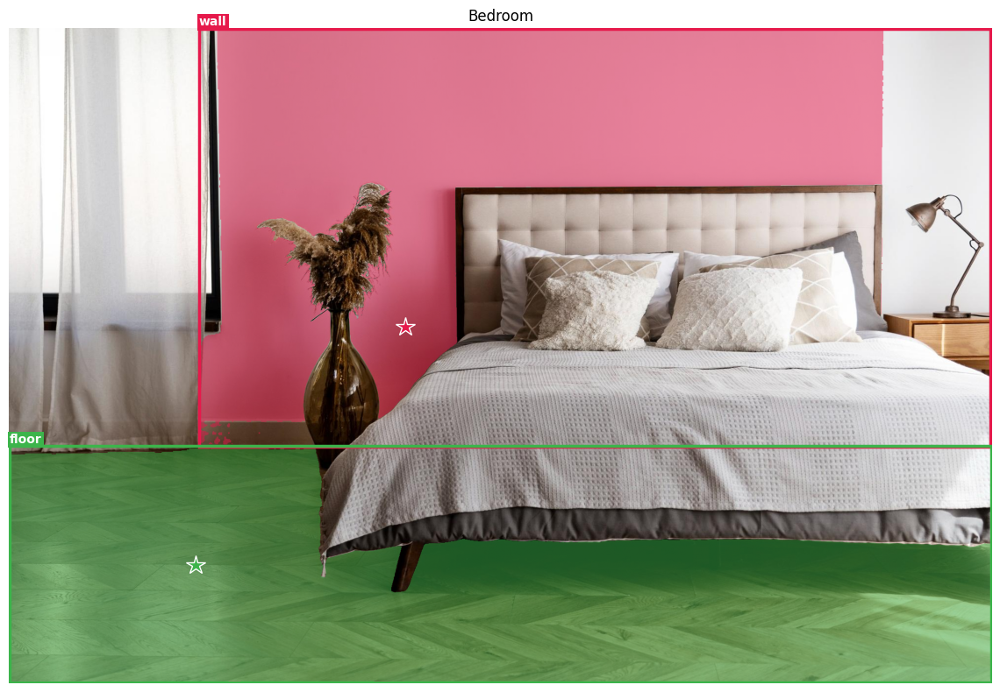

In [ ]:
# Overlay visible (solid) vs amodal-only (hidden-behind-objects) on the original
hidden_wall = dbg["full_wall"] & ~wall_v       # wall recovered behind objects
hidden_floor = dbg["full_floor"] & ~floor_v
show_sample(
    OUTPUT_DIR / SAMPLE,
    overlays=[
        (wall_v,       (230, 25, 75), 0.5),    # visible wall
        (floor_v,      (60, 180, 75), 0.5),    # visible floor
    ],
)
plt.tight_layout()
plt.show()